In [1]:
using DelimitedFiles
using Plots

In [34]:
params = readdlm("params.txt")
function envelope(t)
    if t < 2
        return sin(pi/4*t)^2
    elseif 28 < t <= 30
        return cos(pi/4*(t-28))^2
    else
        return 1
    end
end

h_times = LinRange(0,30,200+2)[2:end-1]
dt = h_times[1]
function pulse(p, t)
    out = 0
    w_sum = 0
    for (i, ht) in enumerate(h_times)
        w = exp( - 10/(2*dt^2) * (t - ht)^2)
        out += p[i] * w
        w_sum += w
    end
    envelope(t)*out/w_sum
end

pulse (generic function with 1 method)

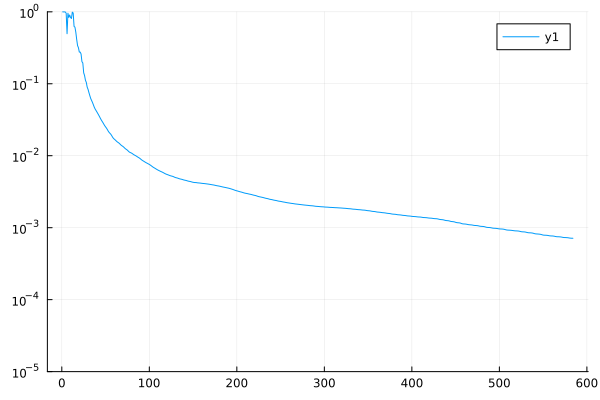

In [35]:
ls = readdlm("ls.txt")
plot(ls,yaxis=:log,ylim=(1e-5,1))

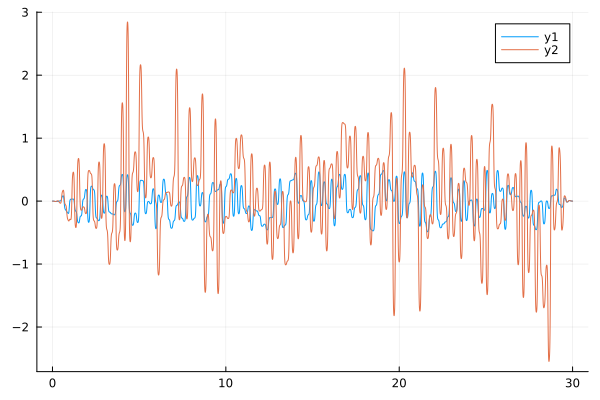

In [38]:
times = LinRange(0,30,5000)
plot(times, [[pulse(params[1,:],t) for t in times],[pulse(params[end,:],t) for t in times]])

# Husk at alle pulse skal ændres fra < til <=

# Seemingly doesn't work, because of
$$U U^\dagger \neq \mathcal{1} $$

In [2]:
using LinearAlgebra
using Plots
using SparseArrays
using Arpack #Eigenvalues of sparse arrays with eigs()
using DifferentialEquations
using DiffEqFlux
using Optim
using ForwardDiff
using DelimitedFiles

In [3]:
#Def parameters
n_cutoff = 8
N = 2 * n_cutoff + 1
NHilbert = N^2
n = sparse(Diagonal(LinRange(-n_cutoff, n_cutoff, N))) #Perhaps implement using StaticArrays
Id = sparse(I, N, N)
exp_iPhi = spdiagm(-1 => ones(N - 1));

#Def Hamiltonian parameters
E_J_GHz = 10.0 #scale of E_J in units of h*GHz, h-bar = 1, h = 2pi
E_C = 1/100  #Charging energies
E_J = 1.0 #Josephson energies
phi_ext = 0.995pi

prefactor = 4 * E_C
Kinetic = 2pi * E_J_GHz * prefactor * (kron(n^2, Id) .+ kron(Id, n^2))

Potential1 = -2pi * E_J_GHz * kron(1 / 2 * (exp_iPhi .+ exp_iPhi'), Id) # -E_J1 cos(phi1)
Potential2 = -2pi * E_J_GHz * kron(Id, 1 / 2 * (exp_iPhi .+ exp_iPhi')) # -E_J2 cos(phi2)
Pot3Mat = kron(exp_iPhi, exp_iPhi')
Pot3Const = -2pi * E_J_GHz * E_J / 2

function get_Pot3(Φ_ext = phi_ext)
    M = exp(im * Φ_ext) * Pot3Mat
    return Pot3Const * (M + M')
end

Potential3 =  get_Pot3() #-E_J3 cos(phi1 - phi2 + phi_ext)
Potential12 = E_J * (Potential1 + Potential2)
KinPot12 = Kinetic + Potential12
chargecoupling = kron(n, Id);

In [4]:
saved_ps = readdlm("C:\\Users\\jv97\\github\\Quantum-Optimal-Control\\JuliaStuff\\Archive\\2data_clean.txt");

In [5]:
p = saved_ps[1,:]

function limit_func(param,pmin,pmax)
    if pmin < param < pmax
        return param
    elseif param <= pmin
        return pmin
    else
        return pmax
    end
end

function alpha(p, t)
    Tₐ = limit_func(p[2],0,15)
    Tₚ = 30 - 2*Tₐ#p[3]
    αmin = limit_func(p[4],0.5,1)
    abs_slope = (1 - αmin)/Tₐ
    if t < Tₐ
        return 1 - abs_slope * t
    elseif t > Tₐ + Tₚ
        return αmin + abs_slope * (t - Tₐ - Tₚ)
    else
        return αmin
    end
end

dalphadt(p, t) = ForwardDiff.derivative(t̃ -> alpha(p,t̃), t)

function envelopes!(E, Edot, Tᵣ, Tₐ, Tₚ, t)
    if Tₐ < t < Tₐ + Tᵣ
        arg = pi / 2 * (t - Tₐ) / Tᵣ
        E *= sin(arg)^2
        Edot *= 2*sin(arg)*cos(arg)*pi/(2*Tᵣ)
    elseif Tₐ + Tᵣ <= t <= Tₐ + Tₚ - Tᵣ
        E *= 1
        Edot *= 0
    elseif Tₐ + Tₚ - Tᵣ < t < Tₐ + Tₚ
        arg = pi / 2 * (Tₐ + Tₚ - t) / Tᵣ
        E *= sin(arg)^2
        Edot *= 2*sin(arg)*cos(arg)*(-pi)/(2*Tᵣ)
    else
        E *= 0
        Edot *= 0
    end
    return (E, Edot)
end

function pulse(p, t)
    Tₐ = limit_func(p[2],0,15)
    Tₚ = 30 - 2*Tₐ#p[3]
    Tᵣ = limit_func(p[1],0,Tₚ/2)
    # αmin = p[4]
    ϕ = p[5]
    f = p[6]
    A = p[7]
    # Φ_ext = p[8]
    λ = p[9]

    amp = pi * A / (Tₚ - Tᵣ)
    E = amp
    Edot = copy(amp)
    E, Edot = envelopes!(E, Edot, Tᵣ, Tₐ, Tₚ, t)
    arg = f*(t - Tₐ) + ϕ
    return E*cos(arg) + Edot*λ*sin(arg)
end

dpulsedt(p, t) = ForwardDiff.derivative(t̃ -> pulse(p, t̃), t)

dpulsedt (generic function with 1 method)

In [37]:
# N = 24
Es = eigvals(Matrix(KinPot12 + Potential3))
ψs = eigvecs(Matrix(KinPot12 + Potential3));

In [7]:
# N = 20
# Es, ψs = eigs(KinPot12 + Potential3, nev=N, which=:SR, tol=0.0, maxiter=10000);

In [8]:
N=10
Ua = ψs[:,1:N]'*Potential3*ψs[:,1:N]
Uv = ψs[:,1:N]'*chargecoupling*ψs[:,1:N]
# U = diagm(ones(N))
ψ0 = zeros(N,1)
ψ0[1] = 1.0

# u0 = cat(real(Es),Ua,Uv,U,dims=2);
u0 = cat(real(Es[1:N]),Ua,Uv,ψ0,dims=2);

# u02 = cat(real(Es),ψs',ψ0,dims=2);

u03 = ψs[:,1];

In [9]:
function H_int!(du, u, p, t)
    D = u[:,1]
    Ua = u[:,2:N+1]
    Uv = u[:,N+2:2*N+1]
    # U = u[:,2*N+2:end]
    ψ0 = u[:,end]

    tmp = Ua .* dalphadt(p,t)# + Uv .* dpulsedt(p,t)
    
    F =  1 ./ (D .- D')
    F[diagind(F)] .= 0.0
    Ftmp = F .* tmp

    du[:,1] = real(diag(tmp))
    du[:,2:N+1] = Ftmp*Ua - Ua*Ftmp
    du[:,N+2:2*N+1] = Ftmp*Uv - Uv*Ftmp
    # du[:,2*N+2:end] = (-im .* (diagm(D) + Uv*pulse(p,t)) + Ftmp) * U
    du[:,2*N+2] = (-im .* (diagm(D) + Uv .* pulse(p,t)) + Ftmp) * ψ0
    # du[:,2*N+2] = (-im .* diagm(D) + Ftmp) * ψ0
end

function H2_int!(du, u, p, t)
    D = u[:,1]
    Udagger = u[:,2:NHilbert+1]
    ψ0 = u[:,end]
    
    tmp =  (Udagger * Potential3 * Udagger') .* dalphadt(p,t)

    F =  1 ./ (D .- D')
    F[diagind(F)] .= 0.0
    Ftmp = F .* tmp
    
    du[:,1] = real(diag(tmp))
    du[:,2:NHilbert+1] = Ftmp * Udagger
    du[:,end] = (-im .* (diagm(D) + Uv .* pulse(p,t)) + Ftmp) * ψ0
end

function H3_int!(du, u, p, t)
    H = KinPot12 + alpha(p,t) .* Potential3 + pulse(p,t) .* chargecoupling
    du[:] = -im .* H * u
end

H3_int! (generic function with 1 method)

In [10]:
times = LinRange(0,30,1000)

1000-element LinRange{Float64, Int64}:
 0.0,0.03003,0.0600601,0.0900901,0.12012,…,29.8799,29.9099,29.9399,29.97,30.0

In [17]:
forward_prob = ODEProblem(H3_int!, u03, (0.0, 30.0), p)
sol_true = solve(forward_prob, p=p, saveat=times, reltol=1e-12, abstol=1e-12)

retcode: Success
Interpolation: 1st order linear
t: 1000-element Vector{Float64}:
  0.0
  0.03003003003003003
  0.06006006006006006
  0.09009009009009009
  0.12012012012012012
  0.15015015015015015
  0.18018018018018017
  0.21021021021021022
  0.24024024024024024
  0.2702702702702703
  ⋮
 29.75975975975976
 29.78978978978979
 29.81981981981982
 29.84984984984985
 29.87987987987988
 29.90990990990991
 29.93993993993994
 29.96996996996997
 30.0
u: 1000-element Vector{Vector{ComplexF64}}:
 [7.458437020914339e-10 + 1.9551902702793405e-19im, 4.750172604670167e-9 - 2.4109872830822624e-9im, 1.7278469859489796e-8 - 2.5331983487985524e-8im, -8.479780944650877e-9 - 1.448459245365721e-7im, -4.519062117456444e-7 - 3.8709166967093504e-7im, -2.036542070936497e-6 + 3.7468126641482804e-7im, -2.01878094284718e-6 + 5.374297573957777e-6im, 1.0377096614111675e-5 + 9.271457704915825e-6im, 2.413237916558797e-5 - 1.3890992802487035e-5im, -1.617221532441808e-5 - 4.064449751882963e-5im  …  -1.6172215324465567e

In [21]:
occs_true = zeros(1000,2)
for (i,t) in enumerate(times)
    tmpEs, tmpψs = eigs(KinPot12 + alpha(p,t) .* Potential3, nev=2, which=:SR, tol=0.0);
    occs_true[i,:] = abs2.(tmpψs'*sol_true.u[i])
end

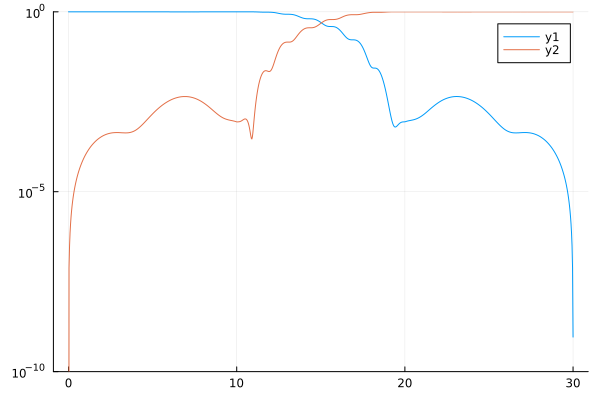

In [26]:
plot(times,occs_true,yaxis=:log,ylim=(1e-10,1))

In [134]:
function N_occ(N)
    Ua = ψs[:,1:N]'*Potential3*ψs[:,1:N]
    Uv = ψs[:,1:N]'*chargecoupling*ψs[:,1:N]
    # U = diagm(ones(N))
    ψ0 = zeros(N,1)
    ψ0[1] = 1.0
    # MeanE = sum(real(Es[1:N]))/N
    u0 = cat(real(Es[1:N].-Es[1]),Ua,Uv,ψ0,dims=2);

    function H_int!(du, u, p, t)
        D = u[:,1]
        Ua = u[:,2:N+1]
        Uv = u[:,N+2:2*N+1]
        # U = u[:,2*N+2:end]
        ψ0 = u[:,end]
    
        tmp = Ua .* dalphadt(p,t)# + Uv .* dpulsedt(p,t)
        
        F =  1 ./ (D .- D')
        F[diagind(F)] .= 0.0
        Ftmp = F .* tmp
    
        du[:,1] = real(diag(tmp))
        du[:,2:N+1] = Ftmp*Ua - Ua*Ftmp
        du[:,N+2:2*N+1] = Ftmp*Uv - Uv*Ftmp
        # du[:,2*N+2:end] = (-im .* (diagm(D) + Uv*pulse(p,t)) + Ftmp) * U
        du[:,2*N+2] = (-im .* (diagm(D) + Uv .* pulse(p,t)) + Ftmp) * ψ0
        # du[:,2*N+2] = (-im .* diagm(D) + Ftmp) * ψ0
    end

    forward_prob = ODEProblem(H_int!, u0, (0.0, 30.0), p)
    sol = solve(forward_prob, p=p, saveat=times, reltol=1e-10, abstol=1e-10)
    occs = zeros(1000,2)
    
    for (i,u) in enumerate(sol.u)
        occs[i,:] = abs2.(u[1:2,end])
    end
    occs

    # for i in range(1,1000,1000)
    #     occs[Int(i),:] = abs2.(sol.u[Int(i)][end,1:2])
    # end
    # occs
    # sol
end

N_occ (generic function with 1 method)

In [145]:
MSE = []
for N in range(2,50,49)
    occs = N_occ(Int(N))
    push!(MSE,sum(abs2.(occs_true - occs))/2000)
end

┌ Warning: Skipped marker arg o.
└ @ Plots C:\Users\jv97\.julia\packages\Plots\jqILG\src\args.jl:1203


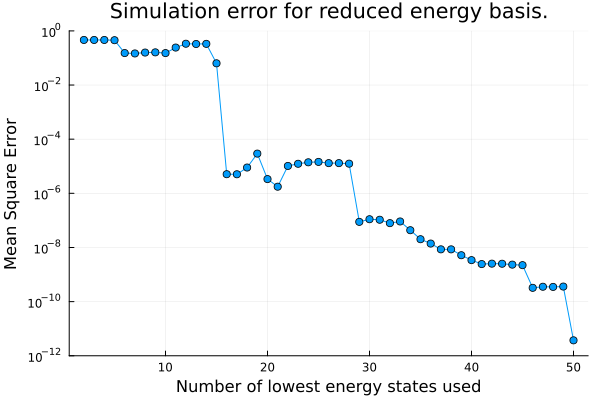

In [158]:
plot(range(2,50,49),MSE,
     yaxis=:log,
     title="Simulation error for reduced energy basis.",
     ylabel="Mean Square Error",
     xlabel="Number of lowest energy states used",
     legend=nothing,
     ylim=(1e-12,1),
     marker="o")

In [159]:
# savefig("Figures/SimErrInstBasis.pdf")

"c:\\Users\\jv97\\github\\Quantum-Optimal-Control\\JuliaStuff\\Figures\\SimErrInstBasis.pdf"

In [99]:
OCCS = [N_occ(N) for N in [5,10,15,20]]

4-element Vector{Matrix{Float64}}:
 [1.0 0.0; 0.9999987321215174 8.087025489379061e-8; … ; 0.9916220522623205 0.008328135110316773; 0.9916296072548538 0.008308930034110915]
 [1.0 0.0; 0.9999984237240558 7.709544396034159e-8; … ; 0.5651546384823041 0.43478477154169337; 0.5650454353820444 0.434891735562045]
 [1.0 0.0; 0.9999984153830793 7.722480120867649e-8; … ; 0.4047820887288017 0.5951911822031547; 0.4045142163712284 0.5954526196733729]
 [1.0 0.0; 0.9999984148395482 7.722576880363668e-8; … ; 0.0015280078855401794 0.9984378533986231; 0.0015185416004557366 0.9984477790629998]

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots C:\Users\jv97\.julia\packages\Plots\jqILG\src\utils.jl:85


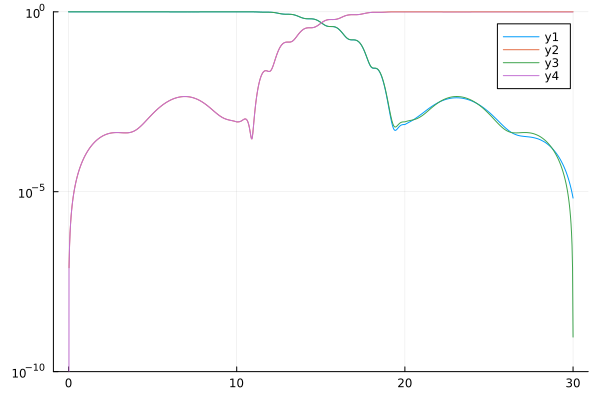

┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots C:\Users\jv97\.julia\packages\Plots\jqILG\src\utils.jl:85
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots C:\Users\jv97\.julia\packages\Plots\jqILG\src\utils.jl:85


In [116]:
# plot(times,OCCS)
plot(times,[N_occ(30),occs_true],yaxis=:log,ylim=(1e-10,1))

In [519]:
tmpEs, tmpψs = eigs(KinPot12 + 0.7 .* Potential3, nev=N, which=:SR, tol=0.0, maxiter=10000);

occs4 = []
for (i, t) in enumerate(sol4.t)
    if alpha(p,t) == 0.7
        push!(occs4,abs2(tmpψs[:,1]'*sol4.u[i]))
    else
        push!(occs4,1)
    end
end

In [ ]:
sum(abs2.(ψs'*sol4.u[end]))

In [492]:
# occs1 = cat([abs2(sol.u[i][1,end-(N-1)]) for i in range(1,length(sol.u))]...,dims=2)
# abs2.(sol.u[end][:,end-(N-1):end])
# abs2.(sol7.u[end][:,end])
occs7 = cat([abs2(sol7.u[i][1,end]) for i in range(1,length(sol7.u))]...,dims=2)
# occs2 = cat([abs2(sol2.u[i][1,end]) for i in range(1,length(sol2.u))]...,dims=2)


1×3410 Matrix{Float64}:
 1.0  1.0  0.999999  0.999999  …  0.00175375  0.00174875  0.00174475

In [367]:
tmpEs, tmpψs = eigs(KinPot12 + alpha(p,sol.t[1500]) .* Potential3, nev=N, which=:SR, tol=0.0, maxiter=10000);
abs2.(sol.u[1500][:,2:NHilbert+1]*tmpψs)

10×10 Matrix{Float64}:
 0.943407     0.00345968   0.042486     …  0.000824367  0.00416927
 0.00218533   0.974738     0.00436355      0.000211774  0.000181967
 6.7215e-30   4.40056e-30  9.3243e-28      7.56685e-29  3.99501e-28
 2.57349e-29  8.79428e-31  6.69122e-28     6.09618e-29  1.34785e-27
 0.0129776    0.000925012  0.626091        0.0515961    0.207137
 9.42373e-6   0.00279752   0.00041277   …  0.00295075   0.000205367
 8.47361e-5   1.46472e-6   0.00152351      0.182028     0.0119292
 4.24283e-5   4.11932e-5   0.00105751      0.510937     0.173942
 1.19427e-30  9.66583e-31  1.32446e-30     8.30992e-30  4.11139e-28
 3.41203e-31  2.26538e-31  3.75857e-31     2.27799e-30  1.85124e-27

In [361]:
tmpEs, tmpψs = eigs(KinPot12 + alpha(p,sol.t[1500]) .* Potential3, nev=N, which=:SR, tol=0.0, maxiter=10000);
abs2.(sol.u[1500][:,2:NHilbert+1]*tmpψs)

5×5 Matrix{Float64}:
 0.887065     0.0214092    0.0686941    1.26842e-29  1.08975e-28
 0.00966539   0.756824     0.0328118    3.58849e-29  2.12315e-29
 1.66796e-28  2.60886e-29  2.20134e-27  0.606085     0.118539
 1.11025e-28  3.83106e-30  1.47557e-27  0.0692452    0.648734
 0.0189586    0.00217117   0.505034     1.66059e-27  4.5535e-27

In [514]:
occs4[10 .< sol4.t .< 20]

1412-element Vector{Any}:
 0.999069099809439
 0.9990690956156858
 0.9990690804581972
 0.9990690583816577
 0.9990690165471386
 0.9990689564967887
 0.9990688653310251
 0.9990687403680554
 0.9990685693942013
 0.9990683460190861
 ⋮
 0.0008736494901484454
 0.0008737495085604131
 0.0008738212076942319
 0.0008738701646114912
 0.0008739014439286518
 0.0008739195604855605
 0.0008739284454330044
 0.0008739314155993817
 0.0008739315720831856

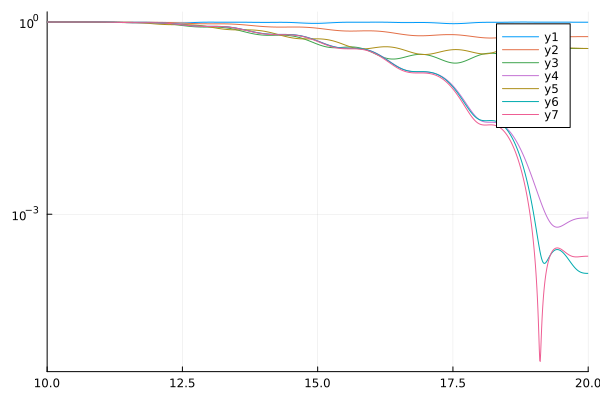

In [525]:
plot([sol.t,sol2.t,sol3.t,sol4.t,sol5.t,sol6.t,sol7.t],
[occs',occs2',occs3',occs4,occs5',occs6',occs7'],yaxis=:log,xlim=(10,20))

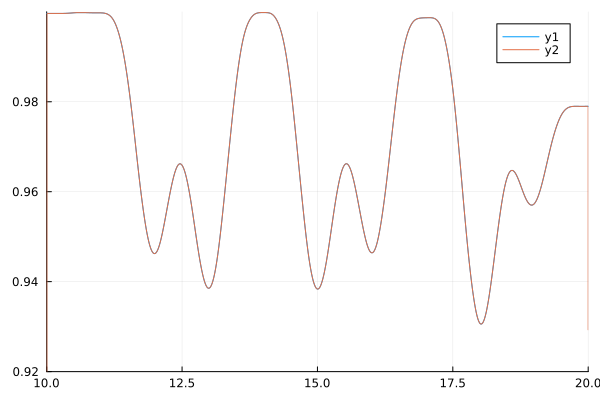

In [407]:
plot([sol.t,sol3.t],[occs1',occs3],ylim=(0.92,1),xlim=(10,20))

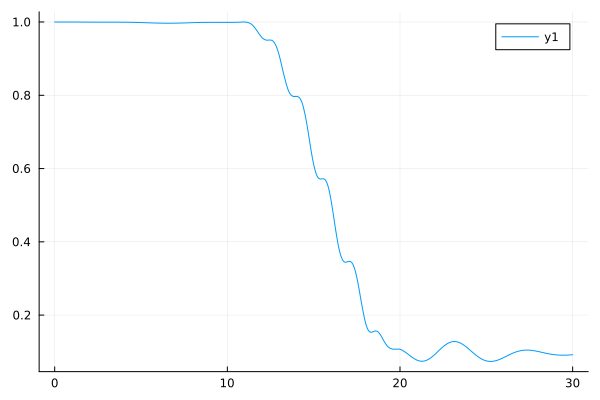

In [212]:
plot(sol.t,occs1')

In [368]:
energies = cat([real(sol.u[i][:,1]) for i in range(1,length(sol.u))]...,dims=2)

10×3257 Matrix{Float64}:
 -78.4681  -78.4592  -78.4535  -78.4461  …  -78.4611  -78.4679  -78.4681
 -76.9242  -76.9155  -76.91    -76.9028     -76.9173  -76.9241  -76.9242
 -66.648   -66.6366  -66.6294  -66.6199     -66.6391  -66.6479  -66.648
 -65.2376  -65.2263  -65.2192  -65.2098     -65.2287  -65.2374  -65.2376
 -60.7097  -60.7091  -60.7088  -60.7083     -60.7092  -60.7097  -60.7097
 -58.5958  -58.5907  -58.5874  -58.5831  …  -58.5918  -58.5957  -58.5958
 -55.9927  -55.9809  -55.9733  -55.9634     -55.9834  -55.9926  -55.9927
 -54.2519  -54.2408  -54.2336  -54.2243     -54.2431  -54.2518  -54.2519
 -51.234   -51.2197  -51.2105  -51.1985     -51.2227  -51.2339  -51.234
 -48.9524  -48.9445  -48.9394  -48.9327     -48.9462  -48.9523  -48.9524

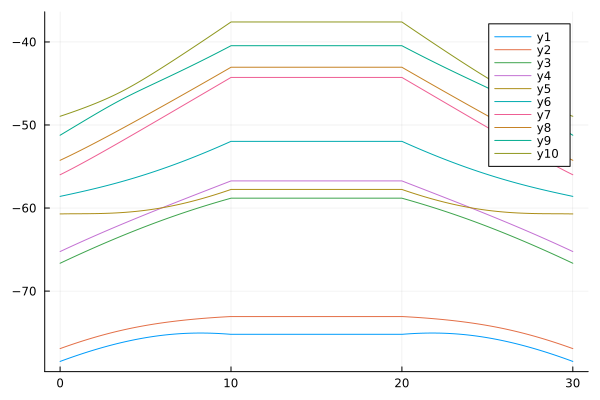

In [369]:
plot(sol.t,energies')

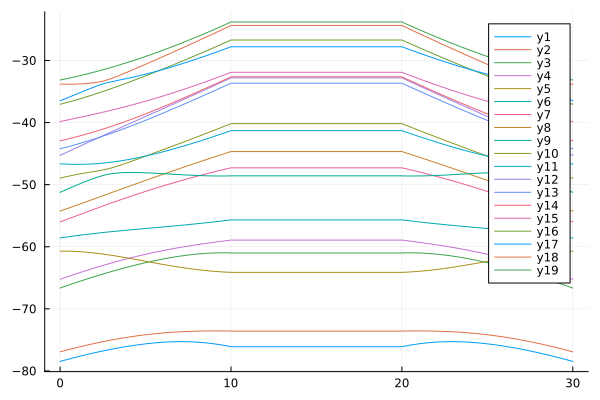

In [280]:
plot(sol.t,energies')

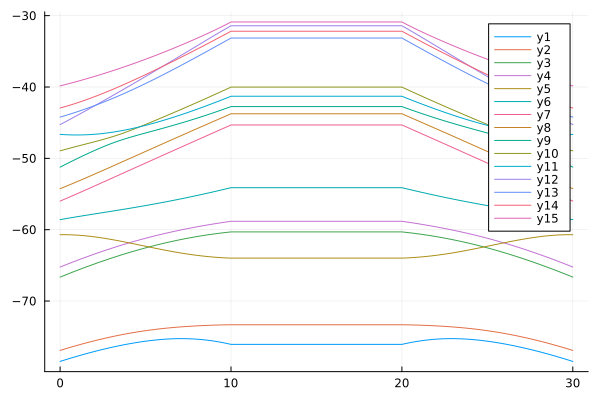

In [197]:
plot(sol.t,energies')

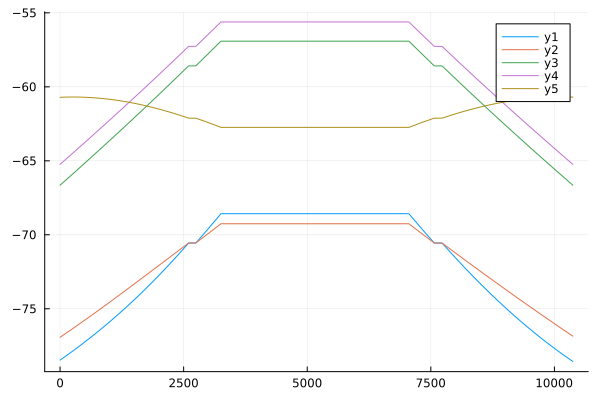

In [29]:
plot(energies')

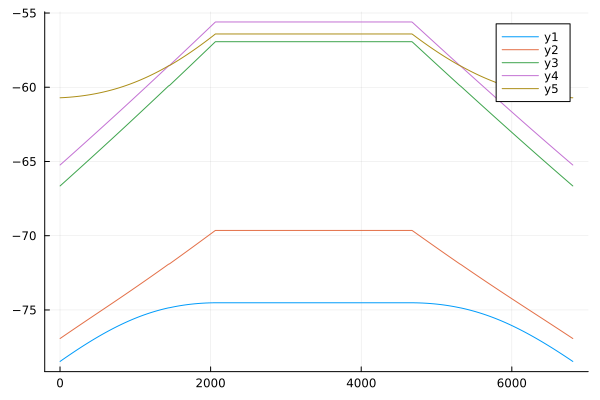

In [11]:
plot(energies')

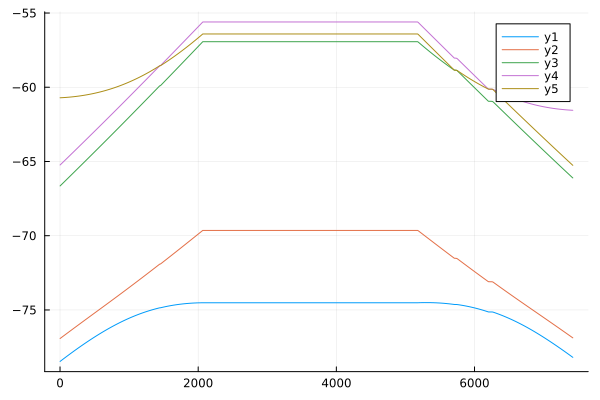

In [196]:
plot(energies')

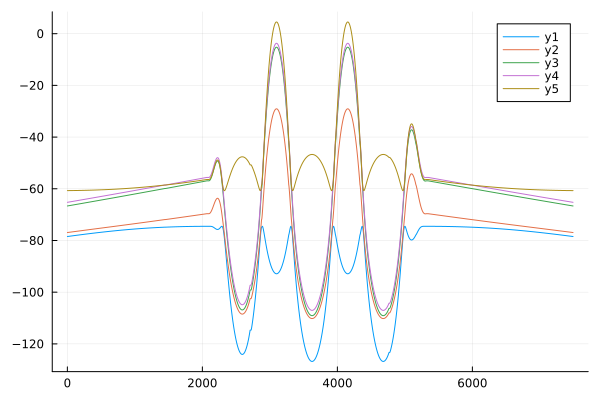

In [192]:
plot(energies')